# Indentation
В работе предлагается рассмотреть вдавливание сферического индентора на поверхность и последующее его удаление, после которого наблюдается некоторое восстановление решетки.
Сила взаимодействя между индентором и нашим веществом определяется следующим образом:

$$ F(r) = K(r-R)^2 $$

где k - константа взаимодействия, R - радиус индентора, r - расстояние между атомом и центром индентора.

In [24]:
import pandas as pd
import plotly.express as px
import numpy as np
import pickle

## Nglview
Рассмотрим статическую визуализацию нашей атомной решетки после удаления индентора испльзуя nglview, для двух разных значений k.

In [33]:
#Значение k - 1000
from ase.io import read
from ase.visualize import view
data = read("../ellipse/data/data_1000/dump.indent")
view(data, viewer="ngl")

In [34]:
#Значение k - 1000000
from ase.io import read
from ase.visualize import view
data = read("../ellipse/data/data_1000000/dump.indent")
view(data, viewer="ngl")

Как и следовало ожидать, различия проявляются в итоговой деформации структуры: во втором случае у нас радиус ямки больше, чем в первом, но что и стоило ожидать, при увеличении силы вдавливания.

 ## Грфики gnu-plot
 
 В работе скриптом перебирался параметр $k$, определяющий силу взаимоействия. после чего awk - скриптом из файла log-lammps мы получали энергию и записывали txt файлы со значением step и энергией системы. И после чего скриптом для построения графиков с помощью gnuplot строили график. После выполнения этих скриптов в телеграм приходит уведомление о построении графика и сам график. 


![alt text](data/changing_k/energies.png)

## Графики plotly

Python скриптом получаем данные из файла dump.inmelt (координаты атомов и промежуток в который эти координаты были записаны).

In [19]:
!python scripts/python_scripts/getting_steps.py

После чего строим визуализированный plotly-график.

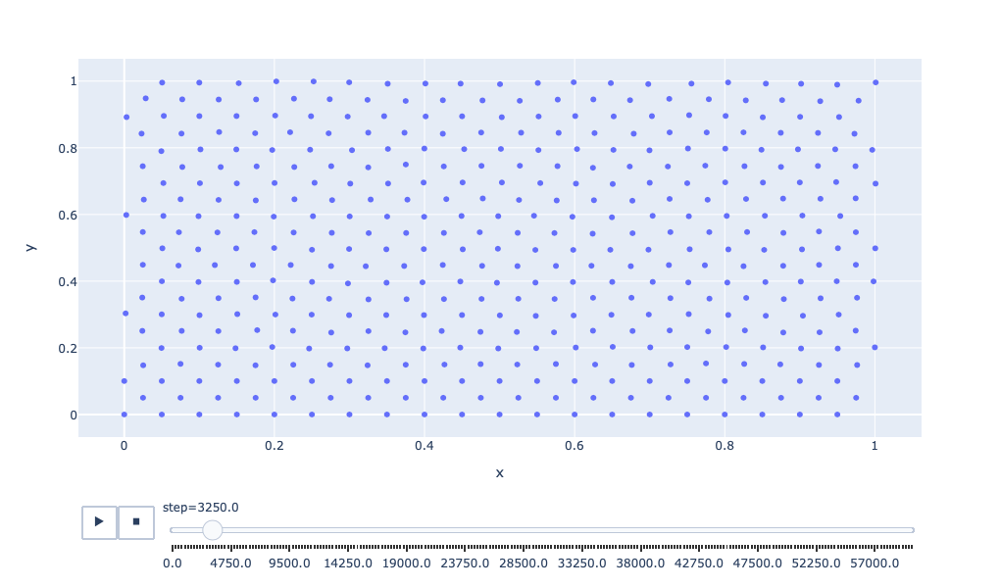

In [20]:
fig = px.scatter(df, x='x', y='y', animation_frame='step', width=600, height=600)
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 90 #Меняем скорость воспроизведения
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 5 #Меняем скорость воспроизведения
fig.show()

### Pickle
Приведем пример использования pickle

Преобразуем файл в потол байтов:

In [29]:
file = open("data/pickle.dump", "wb")
pickle.dump(fig, file)

Преобразуем файл из потока байтов:

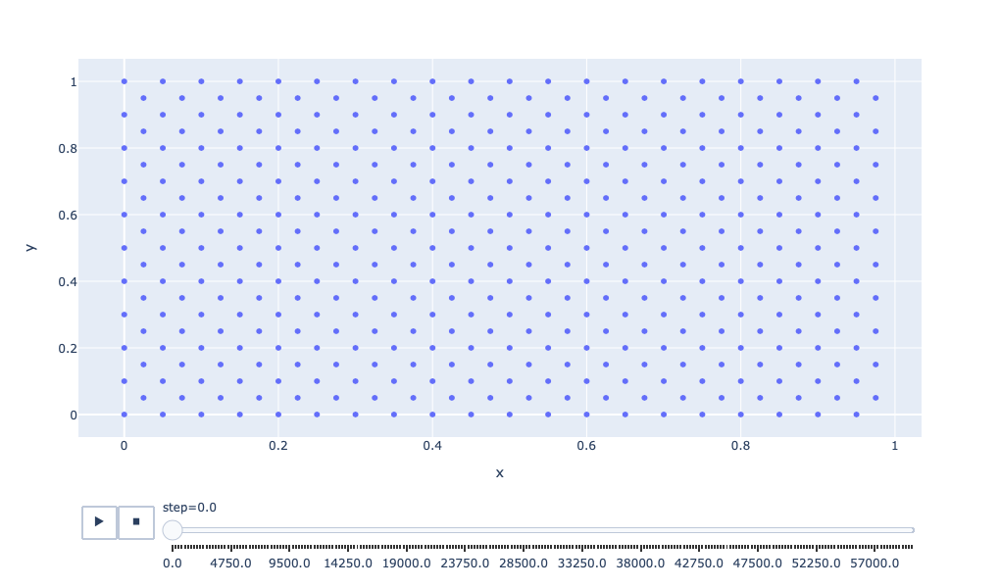

In [32]:
file = open("data/pickle.dump", "rb")
fig_pick = pickle.load(file)
fig_pick

Заметим, что все сработало и мы получили такой же файл, 

## Telegram и crontab: 
Каждый час в 0 минут crontab выполняет скрипт  script_for_cron.bash, который присылает уведомление в телеграм о задачах в squeue.
